## Generative Adversarial Networks - Physics Informed - Burger Equation

### Imports and Configs

In [9]:
import time
import os
import scipy.io
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from gan_pde import*
from scipy.interpolate import griddata
from plotting import newfig, savefig
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import rc
rc('text', usetex=False)
%matplotlib inline

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' 

seed  = 340
tf.set_random_seed(seed)
np.random.seed(seed)
random.seed(seed)

### Load Data

In [2]:
path_lib = os.path.dirname(os.getcwd())
path_resources = os.path.join(path_lib, 'resources')
path_data = os.path.join(path_resources, 'data')
path_models = os.path.join(path_resources, 'models')

filename = 'burgers_shock.mat'
path_file = os.path.join(path_data, filename)
data = scipy.io.loadmat(path_file)

### Deep Learning Params

In [3]:
n_u = 200
n_boundary_t_0 = 50

latent_var_nb = 1

gen_layer_lst = [50, 50, 50, 50, 1]
pos_layer_lst = [50, 50, 50, 50, 1]
dis_layer_lst = [50, 50, 50, 1]

gen_activation_lst = [tf.nn.tanh for i in range(len(gen_layer_lst)-1)]
pos_activation_lst = [tf.nn.tanh for i in range(len(pos_layer_lst)-1)]
dis_activation_lst = [tf.nn.tanh for i in range(len(dis_layer_lst)-1)]
gen_activation_lst.append(None)
pos_activation_lst.append(None)
dis_activation_lst.append(None)

w_pde_loss = 1.0
w_posterior_loss = 1.5

learning_rate = 0.00005
batch_size = 150
dis_steps_nb = 3
gen_steps_nb = 6
iter_nb = 14000

### Prepare Data for Training

In [4]:
t_data = data['t'].flatten()[:, None]
x_data = data['x'].flatten()[:, None]
u_actual = np.real(data['usol']).T
x_mesh, t_mesh = np.meshgrid(x_data, t_data)


data_dict = dict(x=x_mesh.flatten(), t=t_mesh.flatten(), u=u_actual.flatten())
df_data = pd.DataFrame(data_dict)

idx_train = pd.Index(np.random.choice(len(df_data), n_u, replace=False))
idx_boundary_t_0 = pd.Index(np.random.choice(df_data[df_data.t == 0.0].index, n_boundary_t_0, replace=False))
idx_train = idx_train.append((idx_boundary_t_0))

idx_test = df_data.index.difference(idx_train)

u_train = df_data.u[idx_train].values[:,None]
x_train = df_data.x[idx_train].values[:,None]
t_train = df_data.t[idx_train].values[:,None]

u_test = df_data.u[idx_test].values[:,None]
x_test = df_data.x[idx_test].values[:,None]
t_test = df_data.t[idx_test].values[:,None]

### GAN Training

Iter: 0,  discriminator: 1.4179,  generator: 0.3811,  entropy: -0.0055,  posterior: 0.3592,  pde: 0.0275


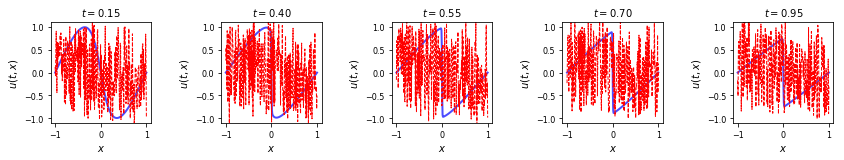

Iter: 500,  discriminator: 1.3565,  generator: 0.0553,  entropy: 0.0506,  posterior: 0.0003,  pde: 0.0044
Iter: 1000,  discriminator: 1.3275,  generator: 0.1376,  entropy: 0.0614,  posterior: 0.0001,  pde: 0.0761
Iter: 1500,  discriminator: 1.3241,  generator: 0.1387,  entropy: 0.0791,  posterior: 0.0000,  pde: 0.0596
Iter: 2000,  discriminator: 1.3192,  generator: 0.2383,  entropy: 0.1041,  posterior: 0.0000,  pde: 0.1342


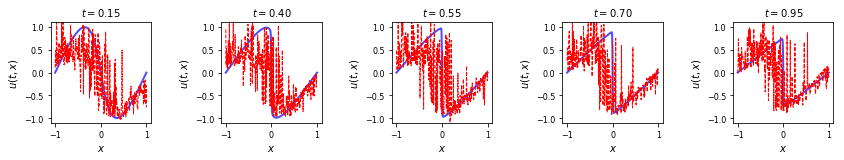

Iter: 2500,  discriminator: 1.3136,  generator: 0.2080,  entropy: 0.1105,  posterior: 0.0000,  pde: 0.0974
Iter: 3000,  discriminator: 1.3352,  generator: 0.2535,  entropy: 0.0799,  posterior: 0.0000,  pde: 0.1735
Iter: 3500,  discriminator: 1.3196,  generator: 0.2242,  entropy: 0.0681,  posterior: 0.0000,  pde: 0.1562
Iter: 4000,  discriminator: 1.3716,  generator: 0.2374,  entropy: 0.0389,  posterior: 0.0000,  pde: 0.1985


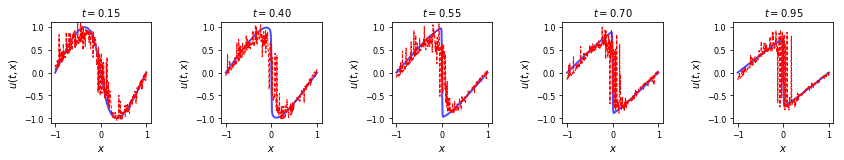

Iter: 4500,  discriminator: 1.3638,  generator: 0.1485,  entropy: 0.0311,  posterior: 0.0000,  pde: 0.1174
Iter: 5000,  discriminator: 1.3472,  generator: 0.1994,  entropy: 0.0683,  posterior: 0.0000,  pde: 0.1310
Iter: 5500,  discriminator: 1.3766,  generator: 0.1332,  entropy: 0.0098,  posterior: 0.0000,  pde: 0.1234
Iter: 6000,  discriminator: 1.3628,  generator: 0.0777,  entropy: 0.0374,  posterior: 0.0000,  pde: 0.0404


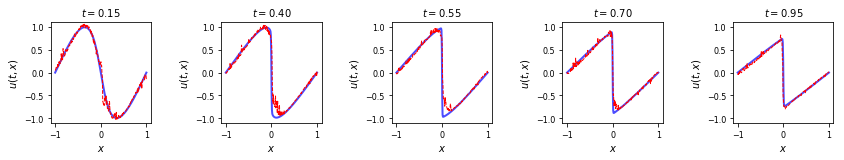

Iter: 6500,  discriminator: 1.3789,  generator: 0.0418,  entropy: 0.0141,  posterior: 0.0000,  pde: 0.0277
Iter: 7000,  discriminator: 1.3737,  generator: 0.0337,  entropy: 0.0145,  posterior: 0.0000,  pde: 0.0193
Iter: 7500,  discriminator: 1.3824,  generator: 0.0305,  entropy: 0.0093,  posterior: 0.0000,  pde: 0.0212
Iter: 8000,  discriminator: 1.3777,  generator: 0.0220,  entropy: 0.0083,  posterior: 0.0000,  pde: 0.0136


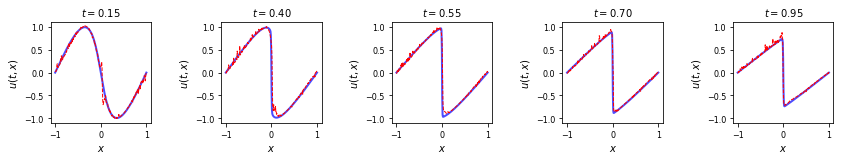

Iter: 8500,  discriminator: 1.3797,  generator: 0.0282,  entropy: 0.0091,  posterior: 0.0000,  pde: 0.0191
Iter: 9000,  discriminator: 1.3804,  generator: 0.0322,  entropy: 0.0080,  posterior: 0.0000,  pde: 0.0243
Iter: 9500,  discriminator: 1.3863,  generator: 0.0141,  entropy: 0.0048,  posterior: 0.0000,  pde: 0.0092
Iter: 10000,  discriminator: 1.3874,  generator: 0.0084,  entropy: 0.0037,  posterior: 0.0000,  pde: 0.0047


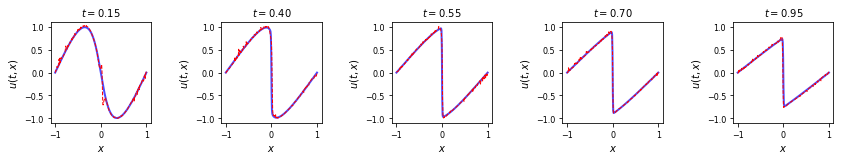

Iter: 10500,  discriminator: 1.3813,  generator: 0.0166,  entropy: 0.0110,  posterior: 0.0000,  pde: 0.0057
Iter: 11000,  discriminator: 1.3801,  generator: 0.0162,  entropy: 0.0129,  posterior: 0.0000,  pde: 0.0033
Iter: 11500,  discriminator: 1.3788,  generator: 0.0120,  entropy: 0.0091,  posterior: 0.0000,  pde: 0.0030
Iter: 12000,  discriminator: 1.3859,  generator: 0.0109,  entropy: 0.0070,  posterior: 0.0000,  pde: 0.0039


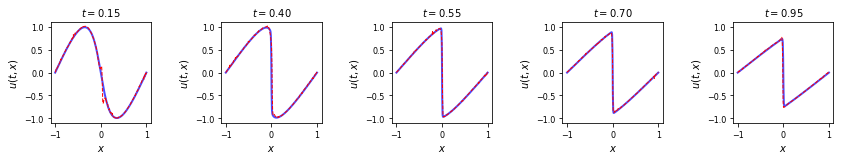

Iter: 12500,  discriminator: 1.3867,  generator: 0.0006,  entropy: -0.0015,  posterior: 0.0000,  pde: 0.0021
Iter: 13000,  discriminator: 1.3855,  generator: 0.0035,  entropy: 0.0009,  posterior: 0.0000,  pde: 0.0025
Iter: 13500,  discriminator: 1.3863,  generator: 0.0016,  entropy: -0.0001,  posterior: 0.0000,  pde: 0.0017


In [5]:
tf.reset_default_graph()

x = tf.placeholder(tf.float32, [None, 1], name='x')
t = tf.placeholder(tf.float32, [None, 1], name='t')

with tf.variable_scope('generator'):
    u_sample = tf.placeholder(tf.float32, [None, latent_var_nb], name='u_sample')
    mlp_config_generator = MLPConfig(layer_size_lst=gen_layer_lst,
                                     activation_lst=gen_activation_lst,
                                     main_name='generator')
    net_pde = create_mlp(tf.concat([x, t, u_sample], 1), mlp_config_generator)
    gen_pde = tf.concat([x, t, net_pde], axis=1, name='gen_pde')
    mlp_config_posterior = MLPConfig(layer_size_lst=pos_layer_lst, 
                                   activation_lst=pos_activation_lst, 
                                   main_name='posterior')
    logits_posterior = create_mlp(gen_pde, mlp_config_posterior)
    net_pde_residuals = net_pde_res_burger(net_pde, x, t)
    
    
with tf.variable_scope('discriminator') as scope:
    u_real = tf.placeholder(tf.float32, [None, 1])
    mlp_config_discriminator = MLPConfig(layer_size_lst=dis_layer_lst, 
                                         activation_lst=dis_activation_lst, 
                                         main_name='discriminator')
    logits_real = create_mlp(tf.concat([x, t, u_real], 1), mlp_config_discriminator)
    scope.reuse_variables()
    logits_fake = create_mlp(gen_pde, mlp_config_discriminator)

dis_loss = discriminator_loss(logits_real, logits_fake)
gen_loss, gen_loss_entropy, gen_loss_posterior, gen_loss_pde = generator_loss(logits_fake, logits_posterior, net_pde_residuals, w_posterior_loss, w_pde_loss)

gen_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="generator")
dis_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="discriminator")
gen_minimize_step = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.9, beta2=0.999, epsilon=1e-08).minimize(gen_loss, var_list=gen_vars)
dis_minimize_step = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.9, beta2=0.999, epsilon=1e-08).minimize(dis_loss, var_list=dis_vars)

init = tf.global_variables_initializer()
model_saver = tf.train.Saver()

with tf.Session() as sess:        
    sess.run(init)
    for i in range(iter_nb):
        idx_batch = np.random.choice(u_train.shape[0], batch_size, replace=False)   
        u_real_batch = u_train[idx_batch, :]
        u_sample_batch = np.random.normal(size=(u_real_batch.shape[0], latent_var_nb))
        x_batch = x_train[idx_batch, :]
        t_batch = t_train[idx_batch, :]
        for _ in range(dis_steps_nb):
            run_lst = [dis_minimize_step, dis_loss]
            feed_dict = {u_real: u_real_batch, u_sample: u_sample_batch, x: x_batch, t: t_batch}
            _, d_loss = sess.run(run_lst, feed_dict=feed_dict)

        for _ in range(gen_steps_nb):
            run_lst = [gen_minimize_step, gen_loss, gen_loss_entropy, gen_loss_posterior, gen_loss_pde]
            feed_dict = feed_dict={u_sample: u_sample_batch,  x: x_batch, t: t_batch}
            _, g_loss, g_loss_entropy, g_loss_posterior, g_loss_pde = sess.run(run_lst, feed_dict=feed_dict)
            
        if i==0:
            loss_array = np.array([i,d_loss,g_loss,g_loss_entropy, g_loss_posterior, g_loss_pde])
        if i % 500 == 0:
            str_out = "Iter: %d,  discriminator: %.4f,  generator: %.4f,  entropy: %.4f,  posterior: %.4f,  pde: %.4f"
            print(str_out % (i, d_loss, g_loss, g_loss_entropy, g_loss_posterior, g_loss_pde))
            loss_array = np.vstack((loss_array, np.array([i,d_loss,g_loss,g_loss_entropy, g_loss_posterior, g_loss_pde])))

        if i % 2000 == 0:
            u_test_sample = np.random.normal(size=(u_test.shape[0], latent_var_nb))
            x_gen = sess.run(gen_pde, feed_dict={u_sample: u_test_sample, x: x_test, t: t_test})
            u_pred = griddata(df_data.loc[idx_test,['x', 't']], x_gen[:,2].flatten(), (x_mesh, t_mesh), method='cubic')

            cut_lst = [15, 40, 55, 70, 95]
            fig, ax = newfig(2.6, 1.4)
            ax.axis('off')
            plot_nb = len(cut_lst)
            gs0 = gridspec.GridSpec(1, plot_nb, wspace=0.7)
            for i in range(plot_nb):
                plot_cut_test(grid_spec=gs0[0,i], x=x_data, actual=u_actual, pred=u_pred, cut=cut_lst[i], x_lim=[-1.1,1.1], y_lim=[-1.1,1.1])

            plt.show()
    model_saver.save(sess, os.path.join(path_models, "gan_burger.ckpt"))

### 3D Actual vs Predicted 

In [14]:
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go

# Make plotly work with Jupyter notebook
init_notebook_mode()

pred = go.Scatter3d(
    x = df_data.t,
    y = df_data.x,
    z = u_pred.flatten(),
    marker = go.Marker(color='red', size=1.5),
    mode = 'markers'
)

actual = go.Scatter3d(
    x = df_data.t,
    y = df_data.x,
    z = df_data.u,
    marker = go.Marker(color='blue', size=1.5),
    mode = 'markers'
)

data = go.Data([pred, actual])

iplot(data)

/Users/a/anaconda/envs/python36/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:426: DeprecationWarning:

plotly.graph_objs.Marker is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Marker
  - plotly.graph_objs.histogram.selected.Marker
  - etc.


/Users/a/anaconda/envs/python36/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




### Loss Functions

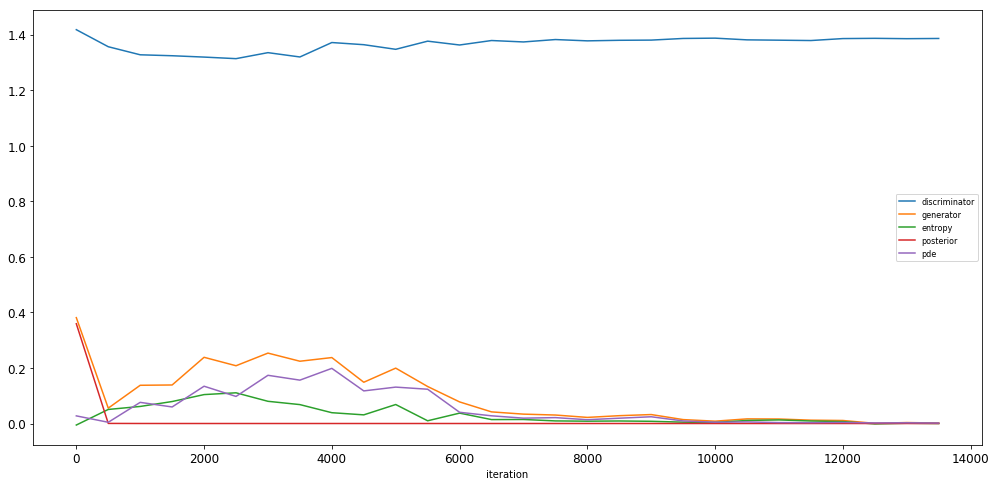

In [7]:
df_loss = pd.DataFrame(loss_array, columns=['iteration', 'discriminator', 'generator', 'entropy', 'posterior', 'pde'])
# df.plot(x=df.iteration, y=df.columns[1:], figsize=(17,8), fontsize=12)
df_loss.iteration = df_loss.iteration.astype(int)
df_loss.set_index(df_loss.iteration, inplace=True)
df_loss.drop(['iteration'], axis=1, inplace=True)
df_loss.plot(figsize=(17,8), fontsize=12)